# Global Terrorism Exploratory Data Analysis

In [1]:
import opendatasets as od

In [2]:
download_url = 'https://www.kaggle.com/datasets/START-UMD/gtd'
od.download(download_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: nayanagal
Your Kaggle Key: ········


100%|██████████| 28.7M/28.7M [00:21<00:00, 1.38MB/s]


In [1]:
data_filename = './gtd/globalterrorismdb_0718dist.csv'

In [2]:
!pip install --upgrade pip --user

  Using cached pip-22.1-py3-none-any.whl (2.1 MB)
  Attempting uninstall: pip
    Found existing installation: pip 22.0.4
    Uninstalling pip-22.0.4:
      Successfully uninstalled pip-22.0.4


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [1]:
!pip install bar_chart_race

     ------------------------------------ 156.8/156.8 KB 669.3 kB/s eta 0:00:00


You should consider upgrading via the 'F:\softwares\Python IDE\Anaconda IDE\python.exe -m pip install --upgrade pip' command.


In [9]:
!pip install basemap

  Using cached basemap-1.3.2-cp39-cp39-win_amd64.whl (443 kB)
  Using cached pyproj-3.3.1-cp39-cp39-win_amd64.whl (6.4 MB)
  Using cached pyshp-2.1.3-py3-none-any.whl
  Using cached basemap_data-1.3.2-py2.py3-none-any.whl (30.5 MB)


In [23]:
!pip install squarify

In [25]:
!pip install descartes

In [ ]:
!pip install pipwin
!pipwin install gdal
!pipwin install fiona
!pip install geopandas

# Importing Libraries

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import folium
import folium.plugins
import warnings
from mpl_toolkits.basemap import Basemap
from matplotlib import animation,rc
import base64
warnings.filterwarnings('ignore')

In [3]:
import plotly.express as px

In [4]:
import squarify
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon
%matplotlib inline

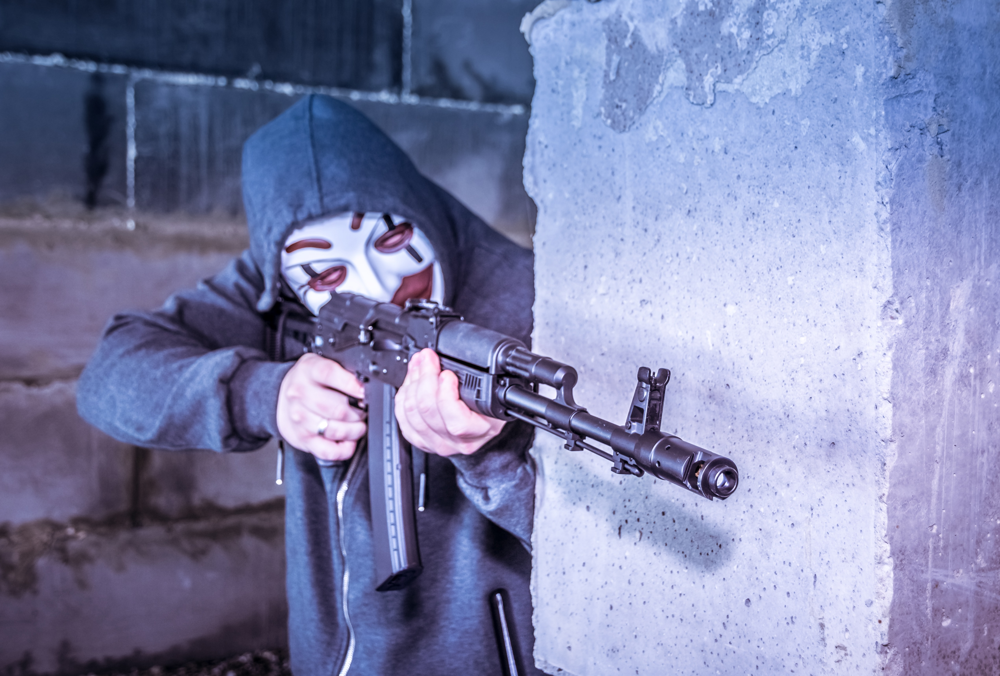

In [4]:
from IPython.display import Image
Image(filename='F:/terror.jpg', width=700)

# Data Preparation and Data Cleaning

In [5]:
terror = pd.read_csv(data_filename,encoding='ISO-8859-1')
terror.head(2)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN


In [6]:
terror.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [6]:
#Dropping Columns
terror.drop(['addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG','INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],axis = 1, inplace = True)

In [7]:
terror.drop(['kidhijcountry', 'ransom', 'ransomamt', 'ransomamtus', 'ransompaid',
       'ransompaidus', 'ransomnote', 'hostkidoutcome', 'hostkidoutcome_txt',
       'nreleased'],axis = 1, inplace = True)

In [8]:
terror.drop(['nperpcap', 'claimed', 'claimmode', 'claimmode_txt', 'claim2',
       'claimmode2', 'claimmode2_txt', 'claim3', 'claimmode3',
       'claimmode3_txt'],axis = 1, inplace = True)

In [9]:
terror_new = terror.dropna(thresh=160000,axis=1)

In [10]:
terror_new.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'attacktype1_txt', 'targtype1', 'targtype1_txt', 'targsubtype1',
       'targsubtype1_txt', 'target1', 'natlty1', 'natlty1_txt', 'gname',
       'guncertain1', 'individual', 'weaptype1', 'weaptype1_txt',
       'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound', 'property',
       'ishostkid'],
      dtype='object')

In [11]:
#Renaming of some coluymns
terror_new.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'state',
                       'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                       'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                       'weaptype1_txt':'Weapon_type','motive':'Motive','natlty1_txt': 'Nationality'},inplace=True)

In [12]:
terror_new.head(2)

,eventid,Year,Month,Day,extended,country,Country,region,Region,state,...,guncertain1,individual,weaptype1,Weapon_type,weapsubtype1,weapsubtype1_txt,Killed,Wounded,property,ishostkid
0,197000000001,1970,7,2,0,58,Dominican Republic,2,Central America & Caribbean,NaN,...,0.0,0,13,Unknown,NaN,NaN,1.0,0.0,0,0.0
1,197000000002,1970,0,0,0,130,Mexico,1,North America,Federal,...,0.0,0,13,Unknown,NaN,NaN,0.0,0.0,0,1.0


In [13]:
terror_new.shape

(181691, 42)

In [14]:
terror_new.isnull().sum().sort_values(ascending=False)[:20]

weapsubtype1        20768
weapsubtype1_txt    20768
Wounded             16311
targsubtype1        10373
targsubtype1_txt    10373
Killed              10313
longitude            4557
latitude             4556
Nationality          1559
natlty1              1559
Target                636
city                  434
state                 421
guncertain1           380
ishostkid             178
specificity             6
doubtterr               1
multiple                1
weaptype1               0
Group                   0
dtype: int64

In [15]:
#Taking only columns which are important
terror_new = terror_new[['Year','Month','Day','Country','state','Region','Nationality','city','latitude','longitude','AttackType','Killed',
         'Wounded','Target','Group','success','Target_type','Weapon_type']]

In [16]:
terror_new.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,1,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Belgium,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,1,Government (Diplomatic),Unknown


In [18]:
terror_new.shape

(181691, 18)

In [17]:
terror_new['Nationality'].fillna('Unknown', inplace=True)
terror_new['state'].fillna('Unknown', inplace=True)

In [18]:
terror_new.dropna(subset=['Killed', 'Wounded', 'longitude', 'latitude'], how='all',inplace=True)

In [19]:
terror_new.shape

(181170, 18)

In [20]:
terror_new.isnull().sum().sort_values(ascending=False)

Wounded        15790
Killed          9792
longitude       4036
latitude        4035
Target           633
city             434
AttackType         0
Target_type        0
success            0
Group              0
Year               0
Month              0
Nationality        0
Region             0
state              0
Country            0
Day                0
Weapon_type        0
dtype: int64

Data Cleaned

# Data Analysis And Visualisation of Global Terrorism

In [23]:
terror_new.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Unknown,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,1,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Belgium,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,1,Government (Diplomatic),Unknown


In [22]:
def world_map(col=None,title=None):
    '''
    Function to plot a choropleth world Map.
    Arguments required:
    1. Column Name for which distribution is to be plotted.
    2. The Title of the Graph.
    '''
    fig = px.choropleth(terror_new,
                  locations='Country',
                  locationmode='country names',
                  hover_name='Country',
                  color=col,
                  color_continuous_scale='electric')

    fig.update_layout(title_text=title)
    fig.show()

## No of Terrorist activities by each Year

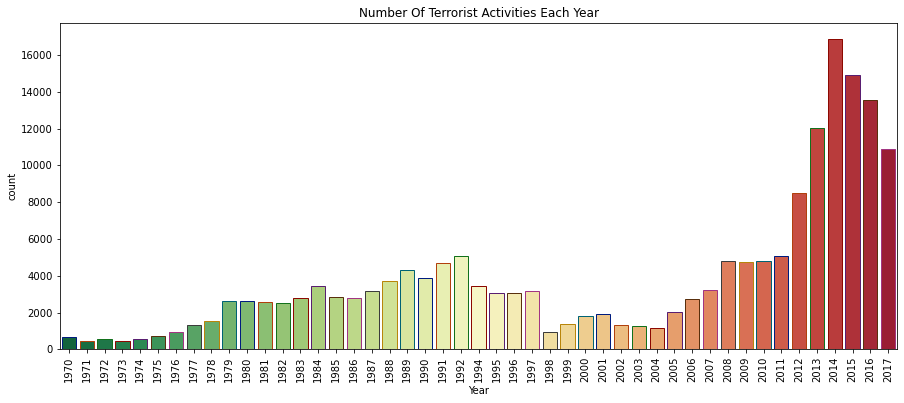

In [25]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=terror_new,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

## Number of Total Attacks in Each Country

In [25]:
country_attacks=list(terror_new['Country'].value_counts()[:15].index)
attack_count = list(terror_new['Country'].value_counts()[:15])


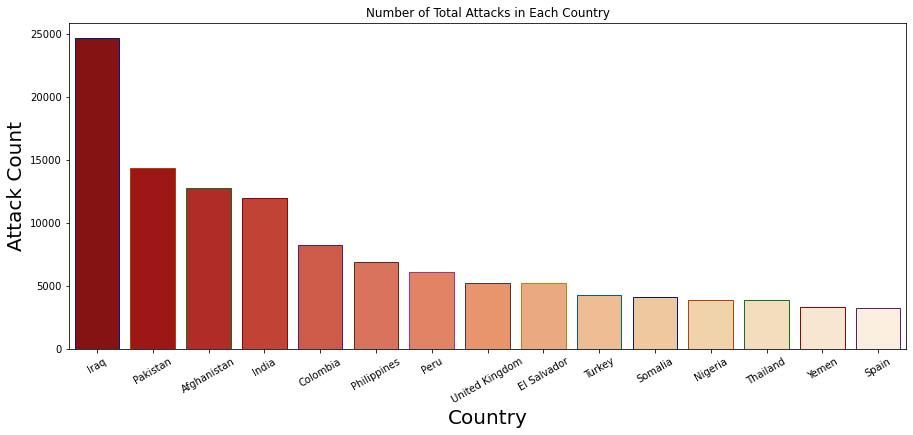

In [82]:
plt.subplots(figsize=(15,6))
sns.barplot(x=country_attacks, y=attack_count, palette= 'OrRd_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=30)
plt.title('Number of Total Attacks in Each Country')
plt.xlabel("Country",fontsize=20)
plt.ylabel("Attack Count",fontsize=20)
plt.show()

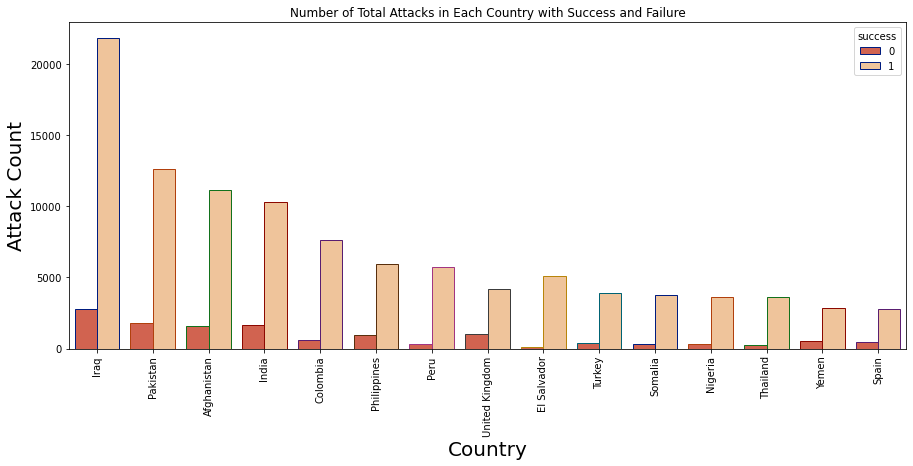

In [84]:
plt.subplots(figsize=(15,6))
sns.countplot(x='Country',hue='success', data = terror_new,order=terror_new['Country'].value_counts().index[:15],palette= 'OrRd_r',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number of Total Attacks in Each Country with Success and Failure')
plt.xlabel("Country",fontsize=20)
plt.ylabel("Attack Count",fontsize=20)
plt.show()

In [68]:
#Attacks on Countries Over the Years
top10 = terror_new.groupby('Country')['Year'].count().nlargest(10).index
top10

Index(['Iraq', 'Pakistan', 'Afghanistan', 'India', 'Colombia', 'Philippines',
       'Peru', 'United Kingdom', 'El Salvador', 'Turkey'],
      dtype='object', name='Country')

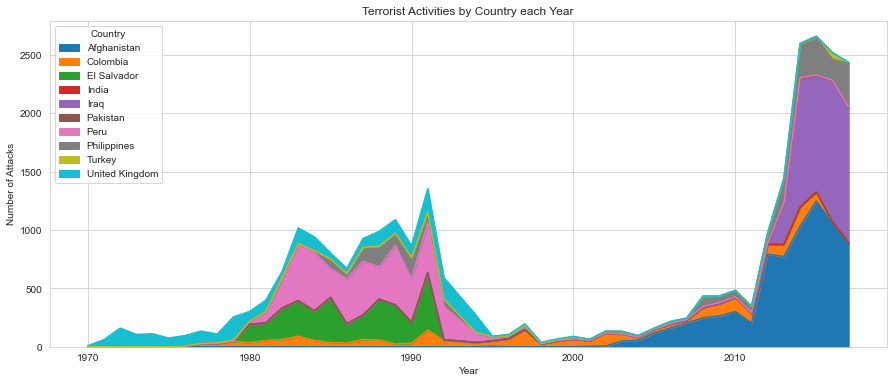

In [71]:
terror_new_topCoun10 = terror_new[terror_new['Country'].isin(top10)]
pd.crosstab(terror_new_topCoun10.Year, terror_new_top10.Country).plot(kind='area',figsize=(15,6))
plt.title('Terrorist Activities by Country each Year')
plt.ylabel('Number of Attacks')
plt.show()

## Number of Total Attacks in Each State 

In [64]:
terror_new['state'].value_counts()[:15]

Baghdad                                7645
Northern Ireland                       4498
Unknown                                4255
Balochistan                            3710
Saladin                                3411
Al Anbar                               3299
Nineveh                                3241
Sindh                                  3206
Khyber Pakhtunkhwa                     3084
Diyala                                 3041
Lima                                   2615
Jammu and Kashmir                      2454
Federally Administered Tribal Areas    2392
San Salvador                           1920
Antioquia                              1891
Name: state, dtype: int64

In [65]:
state_attacks=list(terror_new['state'].value_counts()[:15].index)
state_attack_count = list(terror_new['state'].value_counts()[:15])

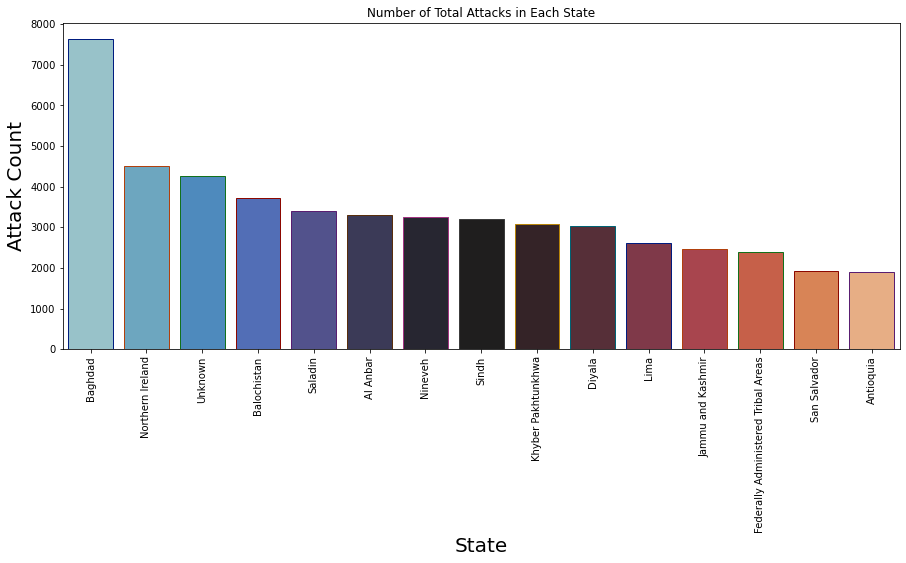

In [75]:
plt.subplots(figsize=(15,6))
sns.barplot(x=state_attacks, y=state_attack_count, palette= 'icefire',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number of Total Attacks in Each State')
plt.xlabel("State",fontsize=20)
plt.ylabel("Attack Count",fontsize=20)
plt.show()

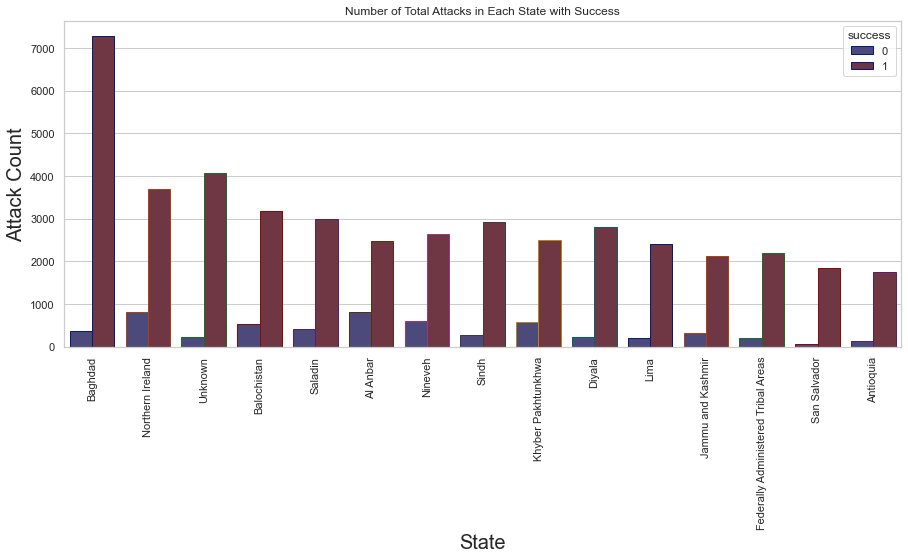

In [39]:
plt.subplots(figsize=(15,6))
sns.countplot(x='state',hue='success', data = terror_new,order=terror_new['state'].value_counts().index[:15],palette= 'icefire',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number of Total Attacks in Each State with Success')
plt.xlabel("State",fontsize=20)
plt.ylabel("Attack Count",fontsize=20)
plt.show()

## Number of Total Attacks in Each Region

In [71]:
region_attacks=list(terror_new['Region'].value_counts()[:15].index)
region_attack_count = list(terror_new['Region'].value_counts()[:15])

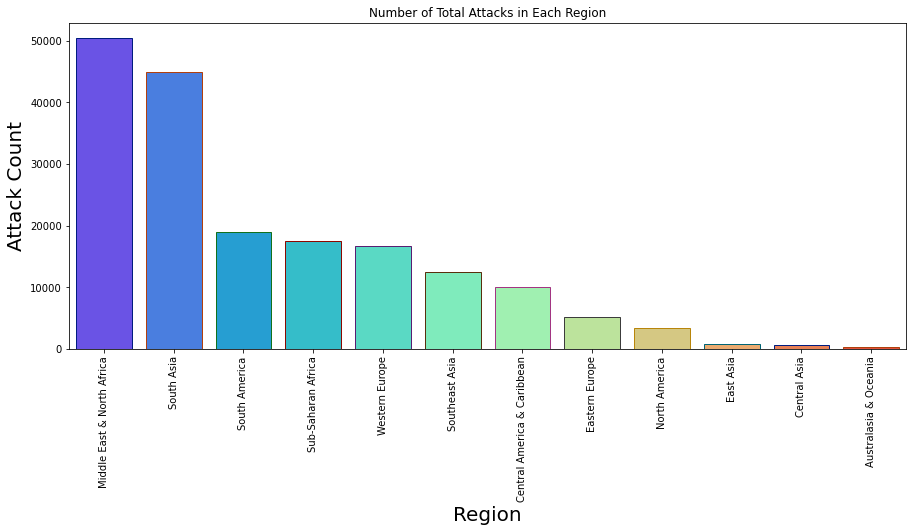

In [72]:
plt.subplots(figsize=(15,6))
sns.barplot(x=region_attacks, y=region_attack_count, palette= 'rainbow',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number of Total Attacks in Each Region')
plt.xlabel("Region",fontsize=20)
plt.ylabel("Attack Count",fontsize=20)
plt.show()

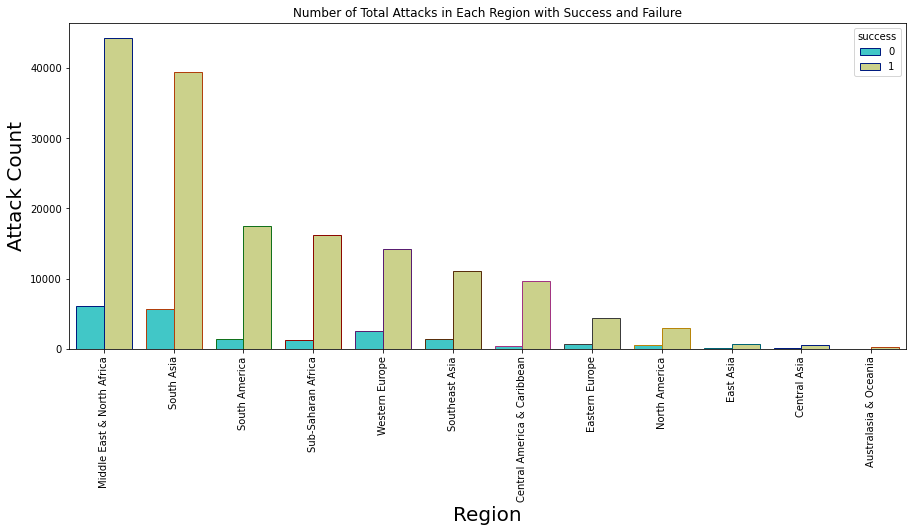

In [86]:
plt.subplots(figsize=(15,6))
sns.countplot(x='Region',hue='success', data = terror_new,order=terror_new['Region'].value_counts().index[:15],palette= 'rainbow',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number of Total Attacks in Each Region with Success and Failure')
plt.xlabel("Region",fontsize=20)
plt.ylabel("Attack Count",fontsize=20)
plt.show()

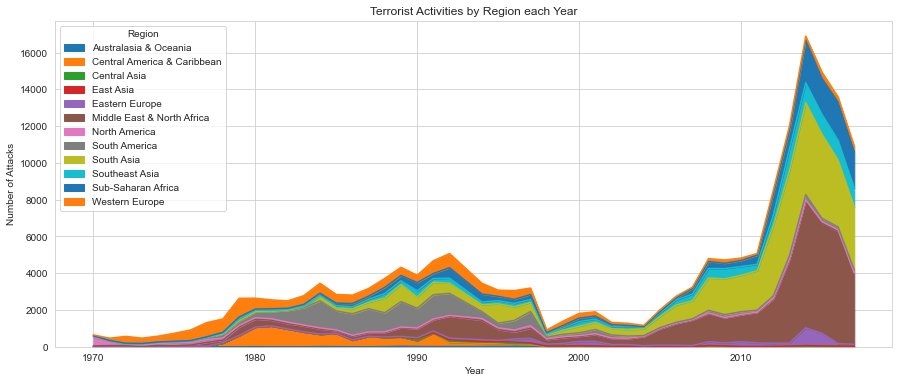

In [42]:
# Num of Attacks Region Wise Over The Years
pd.crosstab(terror_new.Year, terror_new.Region).plot(kind='area',figsize=(15,6))
plt.title('Terrorist Activities by Region each Year')
plt.ylabel('Number of Attacks')
plt.show()



## Success Rate 

In [19]:
terror_new_temp = pd.DataFrame(terror_new[terror_new['success']==1].groupby(terror_new['Country']).size(), columns=['Successful'])
terror_new_temp['Not_Successful'] = terror_new[terror_new['success']==0].groupby(terror_new['Country']).size()                                          

In [20]:
terror_new_temp.fillna(0, inplace=True)

In [21]:
terror_new_temp.reset_index(inplace=True)

In [22]:
terror_new_temp.head(4)

,Country,Successful,Not_Successful
0,Afghanistan,11139,1590.0
1,Albania,64,16.0
2,Algeria,2561,182.0
3,Angola,485,13.0


In [107]:
terror_new_temp['Success_Rate'] = terror_new_temp['Successful']/terror_new_temp['Not_Successful']

terror_new_temp2 = terror_new_temp.sort_values(by='Success_Rate')[:10]
terror_new_temp2.head(5)

,Country,Successful,Not_Successful,Success_Rate
62,Gambia,1,2.0,0.500000
83,Ireland,139,168.0,0.827381
181,Turkmenistan,1,1.0,1.000000
124,New Zealand,11,9.0,1.222222
191,Vietnam,7,5.0,1.400000


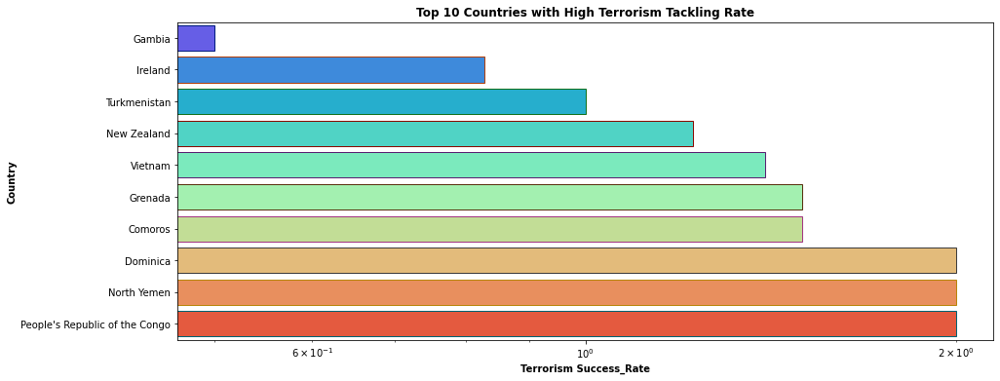

In [108]:
plt.subplots(figsize=(15,6))
sns.barplot(x='Success_Rate', y ='Country', data = terror_new_temp2,palette= 'rainbow',edgecolor=sns.color_palette('dark',10))
plt.xscale('log')
plt.ylabel('Country', weight='bold')
plt.xlabel('Terrorism Success_Rate', weight='bold')
plt.title('Top 10 Countries with High Terrorism Tackling Rate', weight='bold')
plt.show()

## Type of Attack

In [109]:
terror_new.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Unknown,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,1,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Belgium,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,1,Government (Diplomatic),Unknown


In [117]:
terror_new['AttackType'].value_counts()

Bombing/Explosion                      88105
Armed Assault                          42459
Assassination                          19308
Hostage Taking (Kidnapping)            11060
Facility/Infrastructure Attack         10327
Unknown                                 7251
Unarmed Assault                         1014
Hostage Taking (Barricade Incident)      989
Hijacking                                657
Name: AttackType, dtype: int64

In [123]:
attack_count = terror_new['AttackType'].value_counts()[:7]
attack_name = terror_new['AttackType'].value_counts().index[:7]

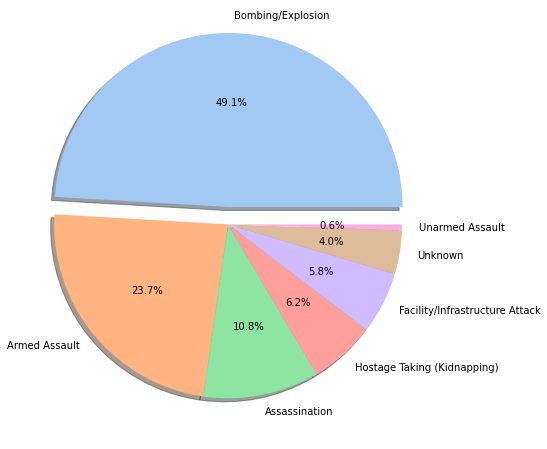

In [124]:
plt.figure(figsize=(12,8))
explode = [0.1,0,0,0,0,0,0]
colors = sns.color_palette('pastel')
plt.pie( attack_count ,labels = attack_name , shadow=True , autopct='%1.1f%%' , colors = colors , explode=explode)
plt.show()

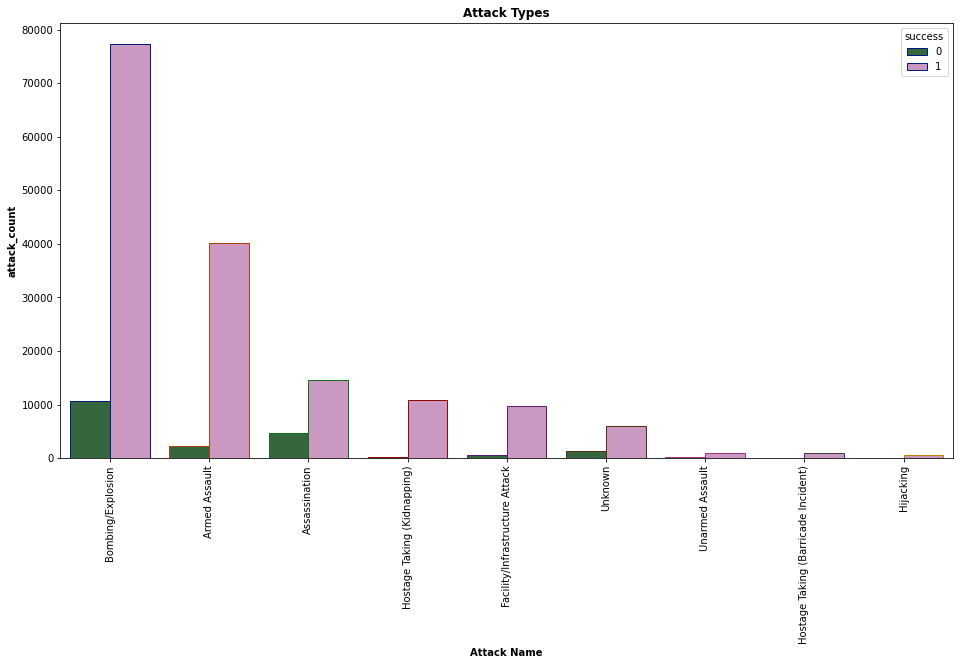

In [129]:
plt.subplots(figsize=(16,8))
sns.countplot(x='AttackType',hue='success',data = terror_new,order=terror_new['AttackType'].value_counts().index,palette='cubehelix',edgecolor=sns.color_palette('dark',10))
plt.ylabel('attack_count', weight='bold')
plt.xlabel('Attack Name', weight='bold')
plt.title('Attack Types', weight='bold')
plt.xticks(rotation=90)
plt.show()

## Target Type 

In [23]:
terror_new.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Unknown,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,1,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Belgium,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,1,Government (Diplomatic),Unknown


In [25]:
terror_new['Target_type'].value_counts()

Private Citizens & Property       43435
Military                          27810
Police                            24484
Government (General)              21253
Business                          20606
Transportation                     6768
Utilities                          5947
Unknown                            5898
Religious Figures/Institutions     4435
Educational Institution            4318
Government (Diplomatic)            3571
Terrorists/Non-State Militia       3037
Journalists & Media                2928
Violent Political Party            1865
Airports & Aircraft                1338
Telecommunication                  1006
NGO                                 969
Tourists                            437
Maritime                            348
Food or Water Supply                317
Abortion Related                    263
Other                               137
Name: Target_type, dtype: int64

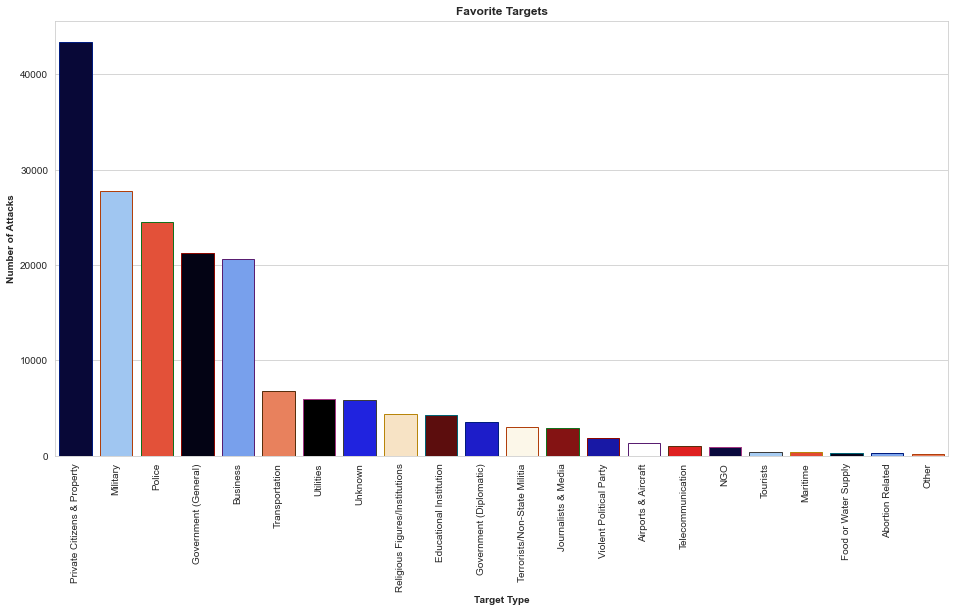

In [28]:
plt.figure(figsize=(16,8))
sns.set_style("whitegrid")
sns.countplot(x='Target_type',data=terror_new,order = terror_new['Target_type'].value_counts().index,
              palette='flag',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.xlabel("Target Type",weight='bold')
plt.ylabel("Number of Attacks",weight='bold')
plt.title('Favorite Targets', weight='bold')
plt.show()

##  Terrorism Groups 

In [29]:
terror_new.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Unknown,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,1,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Belgium,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,1,Government (Diplomatic),Unknown


In [32]:
terror_new['Group'].value_counts()[:10]

Unknown                                             82679
Taliban                                              7476
Islamic State of Iraq and the Levant (ISIL)          5608
Shining Path (SL)                                    4539
Al-Shabaab                                           3285
Farabundo Marti National Liberation Front (FMLN)     3280
New People's Army (NPA)                              2765
Irish Republican Army (IRA)                          2671
Revolutionary Armed Forces of Colombia (FARC)        2463
Boko Haram                                           2418
Name: Group, dtype: int64

In [57]:
top10 = terror_new.groupby('Group')['Year'].count().nlargest(10).index

In [58]:
top10

Index(['Unknown', 'Taliban', 'Islamic State of Iraq and the Levant (ISIL)',
       'Shining Path (SL)', 'Al-Shabaab',
       'Farabundo Marti National Liberation Front (FMLN)',
       'New People's Army (NPA)', 'Irish Republican Army (IRA)',
       'Revolutionary Armed Forces of Colombia (FARC)', 'Boko Haram'],
      dtype='object', name='Group')

In [59]:
terror_new_top10 = terror_new[terror_new['Group'].isin(top10)]

In [60]:
terror_new_top10 = terror_new_top10[~(terror_new_top10['Group']=='Unknown')]

In [61]:
groupYear=pd.crosstab(terror_new_top10.Year, terror_new_top10.Group)
groupYear.head()

Group,Al-Shabaab,Boko Haram,Farabundo Marti National Liberation Front (FMLN),Irish Republican Army (IRA),Islamic State of Iraq and the Levant (ISIL),New People's Army (NPA),Revolutionary Armed Forces of Colombia (FARC),Shining Path (SL),Taliban
Year,,,,,,,,,
1970,0,0,0,7,0,2,0,0,0
1971,0,0,0,60,0,1,0,0,0
1972,0,0,0,162,0,0,0,0,0
1973,0,0,0,111,0,0,0,0,0
1974,0,0,0,113,0,0,0,0,0


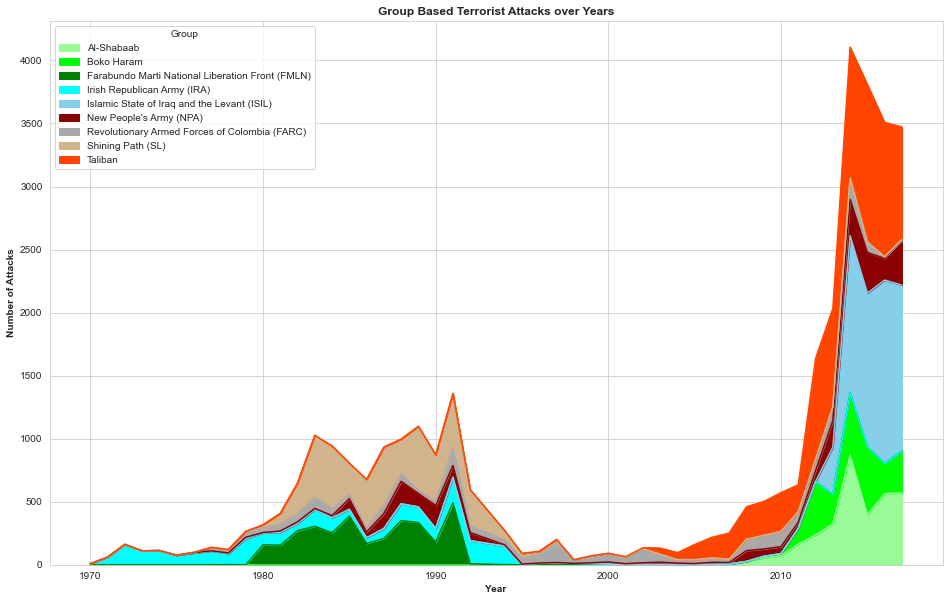

In [73]:
color_list_reg_yr = ['palegreen', 'lime', 'green', 'Aqua', 'skyblue', 'darkred', 'darkgray', 'tan', 'orangered', 'plum']
groupYear.plot(kind='area',figsize=(16, 10), color=color_list_reg_yr)
plt.xlabel('Year', weight='bold')
plt.ylabel('Number of Attacks', weight='bold')
plt.title('Group Based Terrorist Attacks over Years', weight='bold')
plt.show()

## Succesful/Unsuccessful Terror attacks by various groups

In [86]:
terror_new_temp = pd.DataFrame(terror_new_top10[terror_new_top10['success']==1].groupby(terror_new_top10['Group']).size(), columns=['Successful'])
terror_new_temp['Not_Successful'] = terror_new_top10[terror_new_top10['success']==0].groupby(terror_new_top10['Group']).size()

In [87]:
terror_new_temp.reset_index(inplace=True)
terror_new_temp['Total_Attacks'] = terror_new_temp['Successful']+terror_new_temp['Not_Successful']
terror_new_temp['SuccessRatio'] = (terror_new_temp['Successful']/terror_new_temp['Total_Attacks'])*100
terror_new_temp

,Group,Successful,Not_Successful,Total_Attacks,SuccessRatio
0,Al-Shabaab,3013,272,3285,91.719939
1,Boko Haram,2247,171,2418,92.928040
2,Farabundo Marti National Liberation Front (FMLN),3246,34,3280,98.963415
3,Irish Republican Army (IRA),2282,389,2671,85.436166
4,Islamic State of Iraq and the Levant (ISIL),4754,854,5608,84.771755
5,New People's Army (NPA),2450,315,2765,88.607595
6,Revolutionary Armed Forces of Colombia (FARC),2278,185,2463,92.488835
7,Shining Path (SL),4321,218,4539,95.197180
8,Taliban,6678,798,7476,89.325843


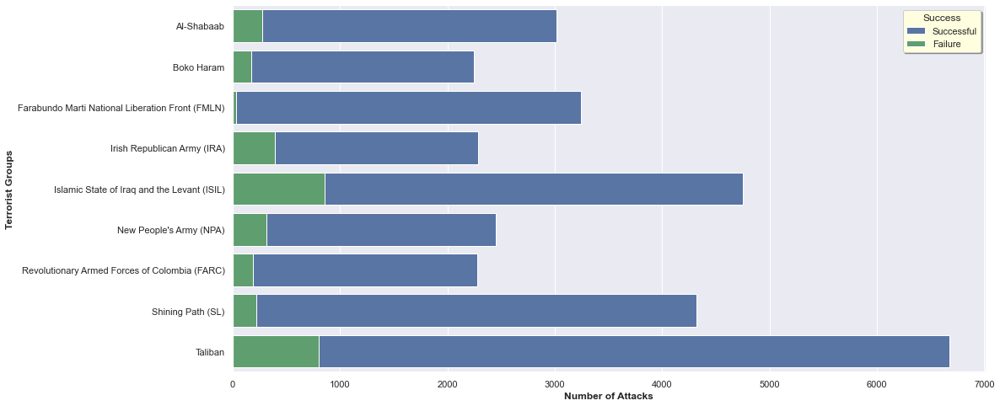

In [88]:
sns.set(style='darkgrid')
plt.figure(figsize=(16,8))
sns.barplot(y='Group', x='Successful', data=terror_new_temp, color='b', label='Successful')
sns.barplot(y='Group', x='Not_Successful', data=terror_new_temp, color='g', label='Failure')
plt.ylabel('Terrorist Groups', weight='bold')
plt.xlabel('Number of Attacks', weight='bold')
plt.legend(title='Success', shadow=True, facecolor='lightyellow')
plt.show()

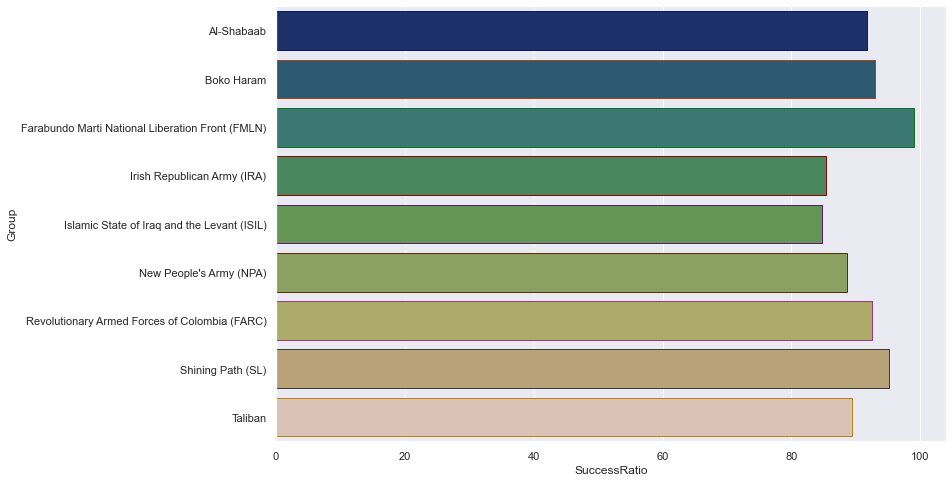

In [96]:
# Success Ratio Plot of various Groups
plt.figure(figsize=(12,8))
colors = sns.color_palette('pastel')
sns.barplot(x='SuccessRatio',y='Group',data = terror_new_temp,palette= 'gist_earth',edgecolor=sns.color_palette('dark',10))
plt.show()

## Number of People killed by Terrorist Groups

In [97]:
Kill = terror_new_top10['Killed'].groupby(terror_new_top10['Group']).sum()
Kill

Group
Al-Shabaab                                           9330.0
Boko Haram                                          20328.0
Farabundo Marti National Liberation Front (FMLN)     8065.0
Irish Republican Army (IRA)                          1804.0
Islamic State of Iraq and the Levant (ISIL)         38923.0
New People's Army (NPA)                              4386.0
Revolutionary Armed Forces of Colombia (FARC)        5661.0
Shining Path (SL)                                   11601.0
Taliban                                             29410.0
Name: Killed, dtype: float64

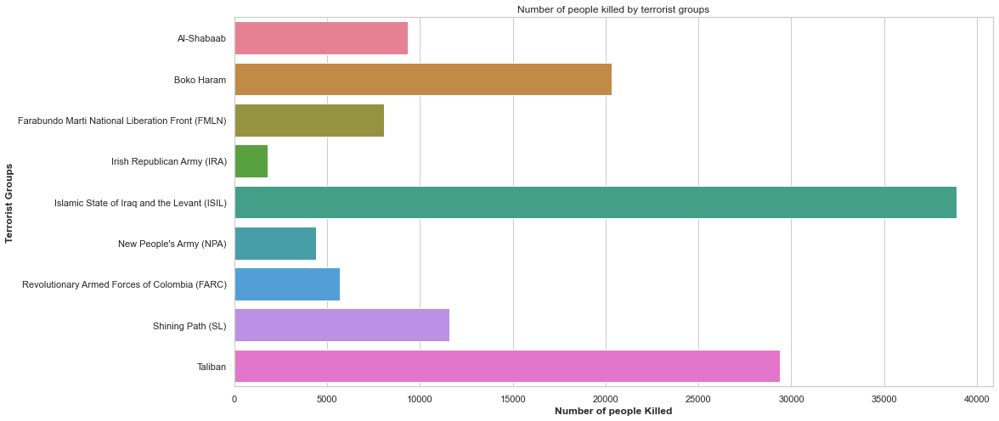

In [99]:
sns.set(style='whitegrid')
plt.figure(figsize=(16,8))
sns.barplot(y= Kill.index.tolist(), x= Kill.tolist(),palette='husl')
plt.ylabel('Terrorist Groups', weight='bold')
plt.xlabel('Number of people Killed', weight='bold')
plt.title("Number of people killed by terrorist groups")
plt.show()

## Number of people wounded byTerrorist Groups

In [100]:
Wound = terror_new_top10['Wounded'].groupby(terror_new_top10['Group']).sum()
Wound

Group
Al-Shabaab                                           7624.0
Boko Haram                                           9473.0
Farabundo Marti National Liberation Front (FMLN)     4065.0
Irish Republican Army (IRA)                          3658.0
Islamic State of Iraq and the Levant (ISIL)         30672.0
New People's Army (NPA)                              3333.0
Revolutionary Armed Forces of Colombia (FARC)        4354.0
Shining Path (SL)                                    3031.0
Taliban                                             27932.0
Name: Wounded, dtype: float64

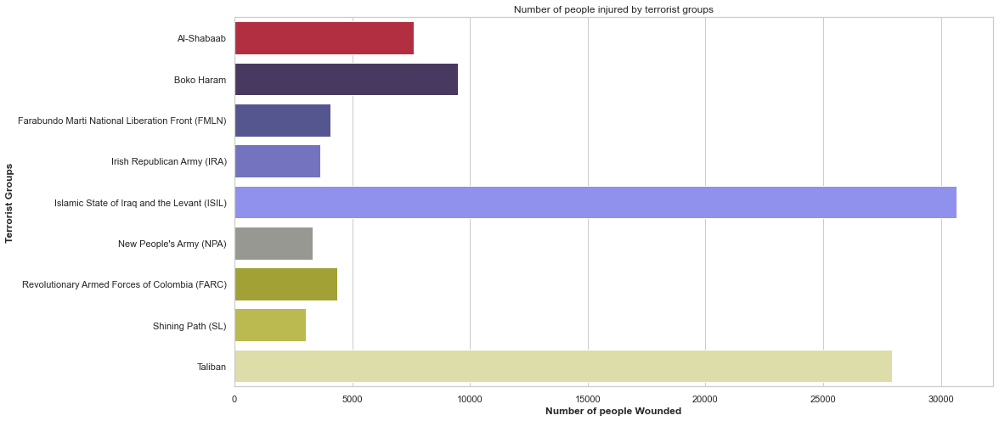

In [101]:
sns.set(style='whitegrid')
plt.figure(figsize=(16,8))
sns.barplot(y= Wound.index.tolist(), x= Wound.tolist(),palette='gist_stern')
plt.ylabel('Terrorist Groups', weight='bold')
plt.xlabel('Number of people Wounded', weight='bold')
plt.title("Number of people injured by terrorist groups")
plt.show()

## Attack Type of Terrorist groups

Text(0, 0.5, 'Terrorist Group')

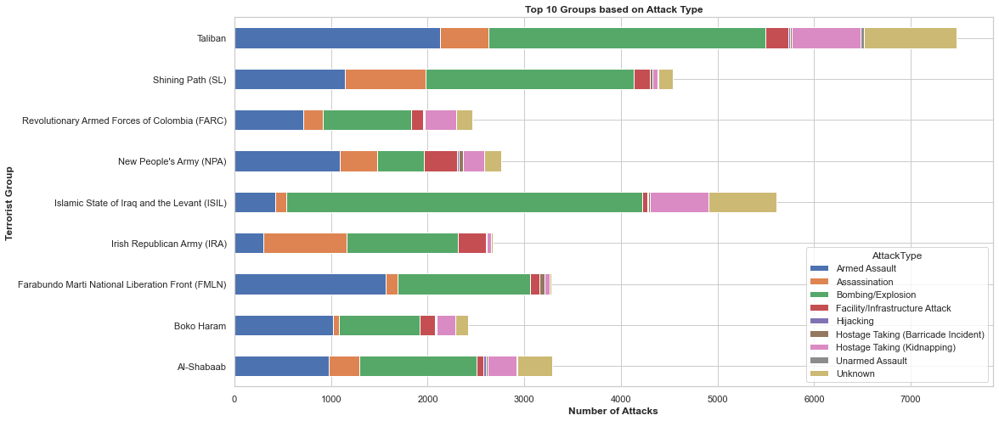

In [104]:
pd.crosstab(terror_new_top10['Group'],terror_new_top10['AttackType']).plot.barh(stacked=True, figsize=(16,8))
plt.title('Top 10 Groups based on Attack Type', weight='bold')
plt.xlabel('Number of Attacks', weight='bold')
plt.ylabel('Terrorist Group', weight='bold')

## Targets of Various Terrorist Groups

Text(0, 0.5, 'Terrorist Group')

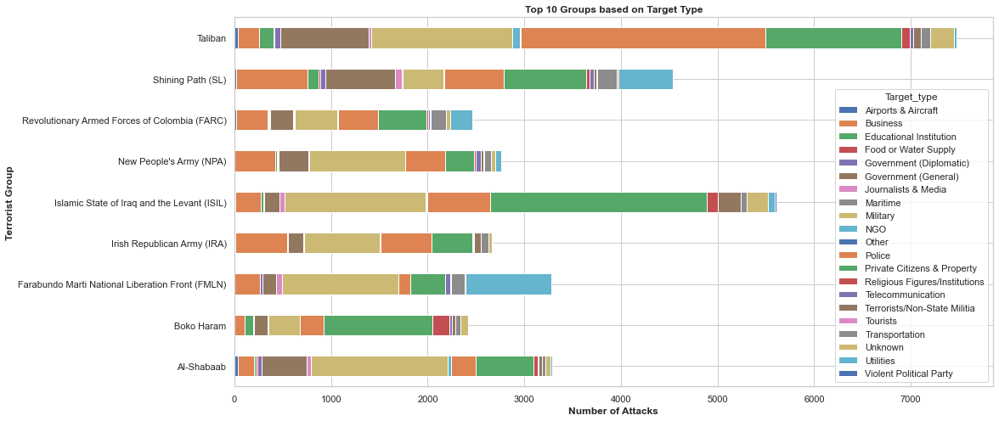

In [108]:
pd.crosstab(terror_new_top10['Group'],terror_new_top10['Target_type']).plot.barh(stacked=True, figsize=(16,8))
plt.title('Top 10 Groups based on Target Type', weight='bold')
plt.xlabel('Number of Attacks', weight='bold')
plt.ylabel('Terrorist Group', weight='bold')

In [109]:
terror_new.head()

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Unknown,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,1,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Belgium,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,1,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Tarlac,Southeast Asia,United States,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,Unknown,1,Journalists & Media,Unknown
3,1970,1,0,Greece,Attica,Western Europe,United States,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,Unknown,1,Government (Diplomatic),Explosives
4,1970,1,0,Japan,Fukouka,East Asia,United States,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,Unknown,1,Government (Diplomatic),Incendiary


## Attack by Groups Based on Weapon Type

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Al-Shabaab'),
  Text(0, 1, 'Boko Haram'),
  Text(0, 2, 'Farabundo Marti National Liberation Front (FMLN)'),
  Text(0, 3, 'Irish Republican Army (IRA)'),
  Text(0, 4, 'Islamic State of Iraq and the Levant (ISIL)'),
  Text(0, 5, "New People's Army (NPA)"),
  Text(0, 6, 'Revolutionary Armed Forces of Colombia (FARC)'),
  Text(0, 7, 'Shining Path (SL)'),
  Text(0, 8, 'Taliban')])

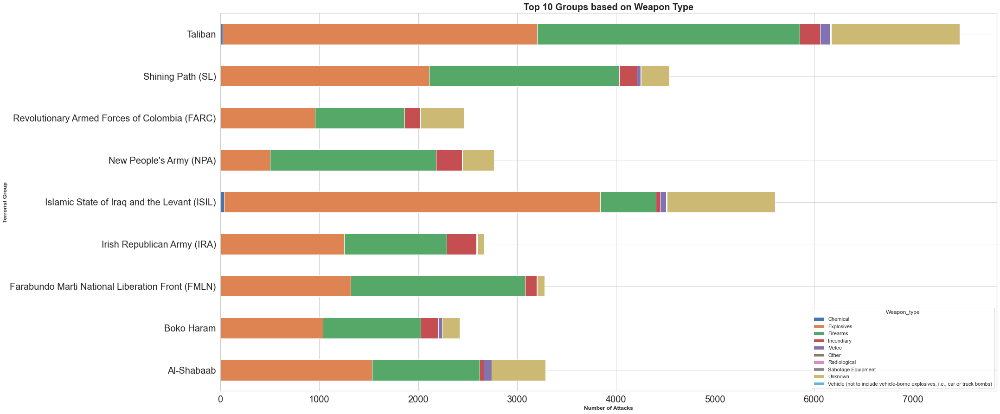

In [111]:
pd.crosstab(terror_new_top10['Group'],terror_new_top10['Weapon_type']).plot.barh(stacked=True, figsize=(30,15))
plt.title('Top 10 Groups based on Weapon Type', weight='bold',fontsize=20)
plt.xlabel('Number of Attacks', weight='bold')
plt.ylabel('Terrorist Group', weight='bold')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

## Nationality of Terrorists

In [115]:
Natnlty = terror_new.Nationality.value_counts()[:40]

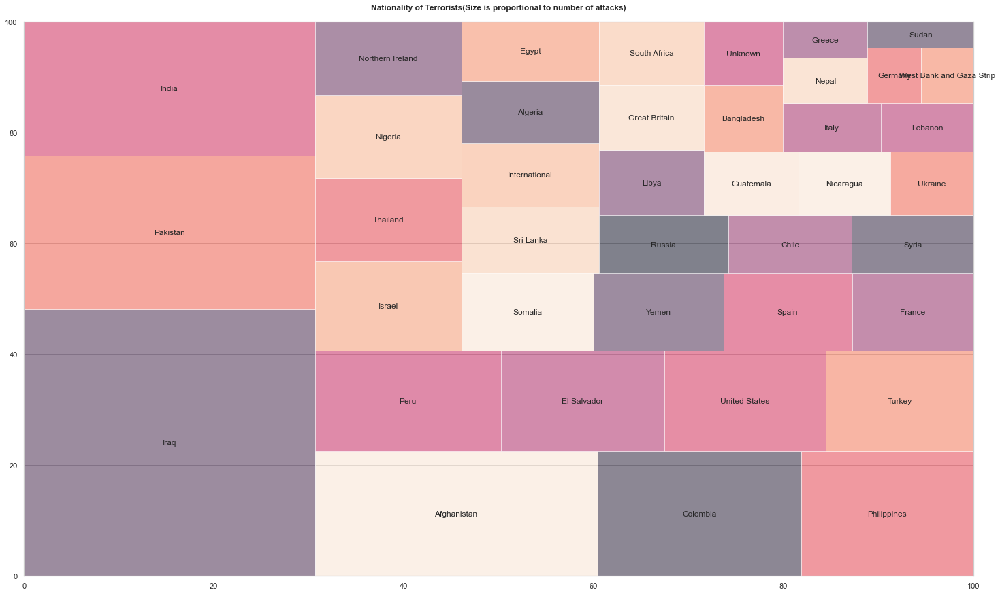

In [119]:
plt.figure(figsize=(25,15))
squarify.plot(sizes=Natnlty.tolist(), label=Natnlty.index.tolist()[:40],alpha=0.5)
plt.title('Nationality of Terrorists(Size is proportional to number of attacks)\n', weight='bold')
plt.show()

## Visualisation of terror attack on World Map(complete dataset)

In [36]:
terror_new['latitude'].fillna(0, inplace=True)
terror_new['longitude'].fillna(0, inplace=True)

In [37]:
terror_new.isnull().sum()

Year               0
Month              0
Day                0
Country            0
state              0
Region             0
Nationality        0
city             434
latitude           0
longitude          0
AttackType         0
Killed         10313
Wounded        16311
Target           636
Group              0
success            0
Target_type        0
Weapon_type        0
dtype: int64

In [38]:
map = folium.Map(tiles='CartoDB positron', zoom_start=2)
markerCluster = folium.plugins.MarkerCluster().add_to(map)
#HeatMap(lat_lon_pairs).add_to(map)
map

In [39]:
terror_Global_loc = terror_new[['city','latitude','longitude']][:1000]
Global_loc = terror_Global_loc.values.tolist()
Global_loc_size = len(Global_loc)
Global_loc_size

1000

## Visualisation of terror attack on World Map(Partial data set)

In [40]:
for point in range(0,Global_loc_size):
    folium.Marker(location=[Global_loc[point][1],Global_loc[point][2]],
                  popup = Global_loc[point][0]).add_to(markerCluster)    
map


# Terrorism in India

In [27]:
terror_India=terror_new[terror_new['Country']=='India']

In [28]:
terror_India.head(1)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
1186,1972,2,22,India,Delhi,South Asia,Germany,New Delhi,28.585836,77.153336,Hijacking,0.0,0.0,B-747,Palestinians,1,Airports & Aircraft,Explosives


## Number of Terrorist Activities In India by Each Year

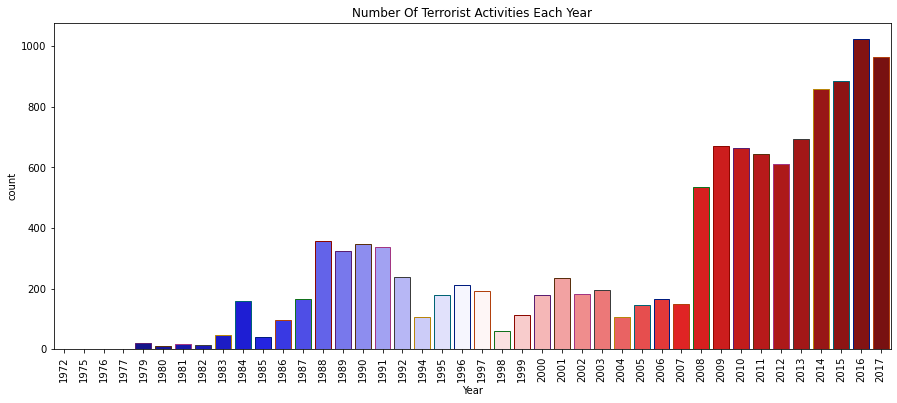

In [32]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=terror_India,palette='seismic',edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

## Number of Total Attacks in Each State of India

In [40]:
India_State = terror_India['state'].value_counts()[:15]
India_State

Jammu and Kashmir    2454
Assam                1151
Manipur              1100
Chhattisgarh          979
Punjab                949
Jharkhand             887
Bihar                 688
West Bengal           650
Odisha                428
Maharashtra           302
Meghalaya             294
Andhra Pradesh        251
Orissa                221
Delhi                 208
Uttar Pradesh         201
Name: state, dtype: int64

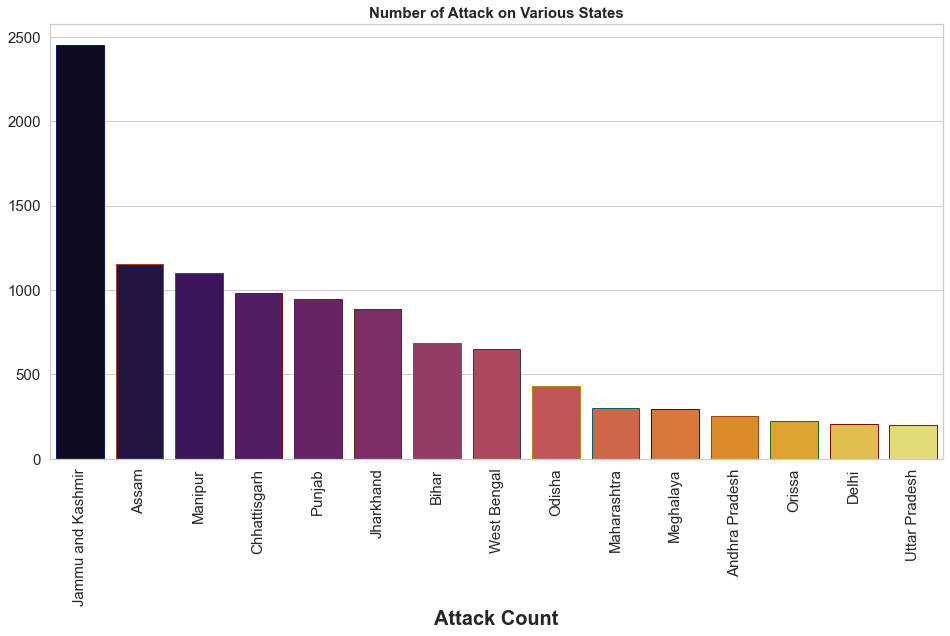

In [44]:
plt.figure(figsize=(16,8))
sns.barplot(x = India_State.index.tolist(), y = India_State.tolist(),palette='inferno', edgecolor=sns.color_palette('dark',10))
plt.xticks(rotation=90,fontsize=15)
plt.yticks(fontsize=15)
plt.title("Number of Attack on Various States",weight='bold',fontsize=15)
plt.xlabel("State",weight='bold',fontsize=20)
plt.xlabel("Attack Count",weight='bold',fontsize=20)
plt.show()

In [62]:
# Bar plot using plotly
fig = px.bar(x = India_State.index.tolist(), y = India_State.tolist())
fig.show()

## Type of Attack

In [28]:
terror_India['AttackType'].value_counts()

Bombing/Explosion                      4825
Armed Assault                          3184
Assassination                          1229
Hostage Taking (Kidnapping)            1184
Facility/Infrastructure Attack          996
Unknown                                 312
Unarmed Assault                         143
Hostage Taking (Barricade Incident)      44
Hijacking                                43
Name: AttackType, dtype: int64

In [50]:
attack_count = terror_India['AttackType'].value_counts()
attack_name = terror_India['AttackType'].value_counts().index

In [54]:
#Using Plotly
fig = px.pie(values=attack_count, names=attack_name)
fig.show()

In [20]:
from folium.plugins import HeatMap

## Map Visualisation of Terrorist Attacks on India(Heat Map and with Markers)

In [29]:
sample_df = terror_India.sample(int(0.5 * len(terror_India)))
lat_lon_pairs = list(zip(list(sample_df.latitude),list(sample_df.longitude)))

In [30]:
terror_India['latitude'].fillna(0, inplace=True)
terror_India['longitude'].fillna(0, inplace=True)

In [31]:
terror_India.isnull().sum()

Year             0
Month            0
Day              0
Country          0
state            0
Region           0
Nationality      0
city             0
latitude         0
longitude        0
AttackType       0
Killed         220
Wounded        454
Target          42
Group            0
success          0
Target_type      0
Weapon_type      0
dtype: int64

In [34]:
map = folium.Map(tiles='CartoDB positron', zoom_start=2)
markerCluster = folium.plugins.MarkerCluster().add_to(map)
#HeatMap(lat_lon_pairs).add_to(map)
map

In [33]:
terror_India_loc = terror_India[['latitude','longitude']]
India_loc = terror_India_loc.values.tolist()
India_loc_size = len(India_loc)
India_loc_size

11960

In [35]:
for point in range(0,India_loc_size):
    folium.Marker(India_loc[point]).add_to(markerCluster)
    
map

# Group

In [29]:
terror_India.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
1186,1972,2,22,India,Delhi,South Asia,Germany,New Delhi,28.585836,77.153336,Hijacking,0.0,0.0,B-747,Palestinians,1,Airports & Aircraft,Explosives
2764,1975,1,2,India,Bihar,South Asia,India,Samastipur,25.863042,85.781004,Bombing/Explosion,4.0,0.0,Lalit Narayan Mishra and a legislator,Ananda Marga,1,Government (General),Explosives


In [52]:
#No of attacks by terror grps
terror_India.groupby(['Group']).Group.count().sort_values(ascending=False)[:20]

Group
Unknown                                                         4263
Communist Party of India - Maoist (CPI-Maoist)                  1877
Maoists                                                         1396
Sikh Extremists                                                  710
United Liberation Front of Assam (ULFA)                          357
Hizbul Mujahideen (HM)                                           199
Lashkar-e-Taiba (LeT)                                            187
National Democratic Front of Bodoland (NDFB)                     174
Garo National Liberation Army                                    166
Muslim Separatists                                               118
People's War Group (PWG)                                          97
National Socialist Council of Nagaland-Isak-Muivah (NSCN-IM)      89
People's Liberation Army (India)                                  88
Bodo Militants                                                    87
Muslim Militants            

In [46]:
top10 = terror_India.groupby('Group')['Year'].count().nlargest(11).index
terror_India_top10 = terror_India[terror_India['Group'].isin(top10)]
terror_India_top10 = terror_India_top10[~(terror_India_top10['Group']=='Unknown')]
groupYear=pd.crosstab(terror_India_top10.Year, terror_India_top10.Group)
groupYear.head(5)

Group,Communist Party of India - Maoist (CPI-Maoist),Garo National Liberation Army,Hizbul Mujahideen (HM),Lashkar-e-Taiba (LeT),Maoists,Muslim Separatists,National Democratic Front of Bodoland (NDFB),People's War Group (PWG),Sikh Extremists,United Liberation Front of Assam (ULFA)
Year,,,,,,,,,,
1979,0,0,0,0,1,0,0,0,0,0
1980,0,0,0,0,2,0,0,0,0,0
1981,0,0,0,0,0,0,0,0,2,0
1982,0,0,0,0,0,0,0,0,1,0
1983,0,0,0,0,0,0,0,0,12,0


In [63]:
terror_India_temp = pd.DataFrame(terror_India_top10[terror_India_top10['success']==1].groupby(terror_India_top10['Group']).size(), columns=['Successful'])
terror_India_temp['Not_Successful'] = terror_India_top10[terror_India_top10['success']==0].groupby(terror_India_top10['Group']).size()
terror_India_temp.reset_index(inplace=True)
terror_India_temp['Total_Attacks'] = terror_India_temp['Successful']+terror_India_temp['Not_Successful']
terror_India_temp['SuccessRatio'] = (terror_India_temp['Successful']/terror_India_temp['Total_Attacks'])*100
terror_India_temp

,Group,Successful,Not_Successful,Total_Attacks,SuccessRatio
0,Communist Party of India - Maoist (CPI-Maoist),1773,104,1877,94.459243
1,Garo National Liberation Army,138,28,166,83.132530
2,Hizbul Mujahideen (HM),182,17,199,91.457286
3,Lashkar-e-Taiba (LeT),175,12,187,93.582888
4,Maoists,1083,313,1396,77.578797
5,Muslim Separatists,106,12,118,89.830508
6,National Democratic Front of Bodoland (NDFB),162,12,174,93.103448
7,People's War Group (PWG),96,1,97,98.969072
8,Sikh Extremists,667,43,710,93.943662
9,United Liberation Front of Assam (ULFA),327,30,357,91.596639


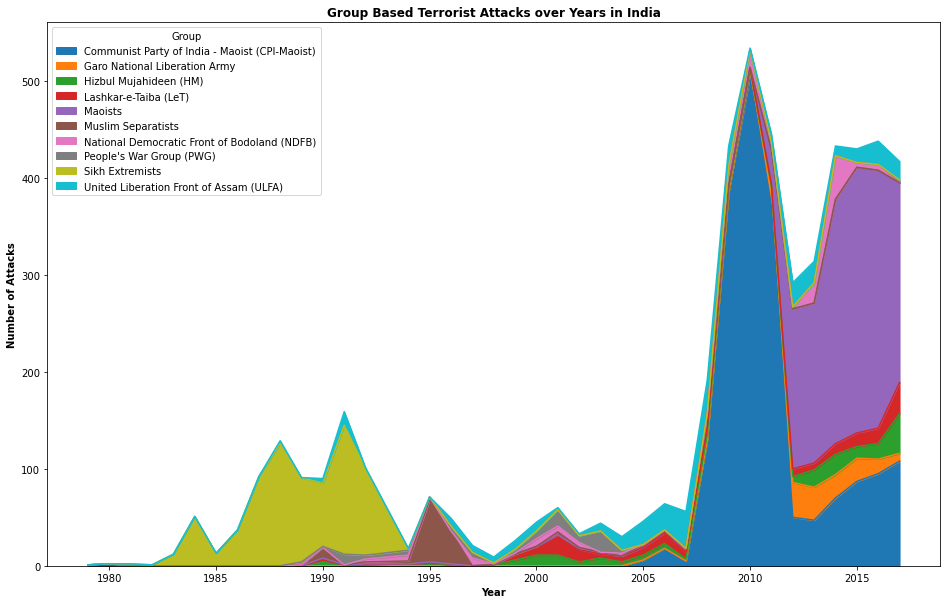

In [54]:
#Terrorist attack over the years
groupYear.plot(kind='area',figsize=(16, 10))
plt.xlabel('Year', weight='bold')
plt.ylabel('Number of Attacks', weight='bold')
plt.title('Group Based Terrorist Attacks over Years in India', weight='bold')
plt.show()

## Jammu And Kashmir

In [89]:
terror_Jammu=terror_India[terror_India['state']=='Jammu and Kashmir']
terror_Jammu.head(2)

,Year,Month,Day,Country,state,Region,Nationality,city,latitude,longitude,AttackType,Killed,Wounded,Target,Group,success,Target_type,Weapon_type
21744,1984,4,17,India,Jammu and Kashmir,South Asia,India,Bhela,33.315527,74.622476,Assassination,2.0,0.0,Gurbachan Singh Sandhar (Sikh lawyer) and wife,Sikh Extremists,1,Private Citizens & Property,Unknown
22108,1984,5,20,India,Jammu and Kashmir,South Asia,India,Jammu,32.726602,74.857026,Bombing/Explosion,1.0,0.0,bridge over a stream,Unknown,0,Transportation,Explosives


In [90]:
top10_Jammu = terror_Jammu.groupby('Group')['Year'].count().nlargest(11).index
terror_Jammu_top10 = terror_Jammu[terror_Jammu['Group'].isin(top10_Jammu)]
terror_Jammu_top10 = terror_Jammu_top10[~(terror_Jammu_top10['Group']=='Unknown')]
groupYear=pd.crosstab(terror_Jammu_top10.Year, terror_Jammu_top10.Group)
groupYear.head(5)

Group,Hizbul Mujahideen (HM),Jaish-e-Mohammad (JeM),Jammu and Kashmir Liberation Front,Kashmiri extremists,Lashkar-e-Taiba (LeT),Militants,Muslim Militants,Muslim Separatists,Muslim extremists,Separatists
Year,,,,,,,,,,
1988,0,0,0,0,0,0,4,0,0,0
1989,0,0,4,1,0,0,5,1,0,0
1990,5,0,40,10,0,0,19,9,0,0
1991,1,0,1,17,0,0,7,0,0,0
1992,1,0,2,21,0,0,11,1,0,0


## Number of people killed by groups in Jammu and Kashmir

In [92]:
Killed_Jammu = terror_Jammu_top10['Killed'].groupby(terror_Jammu_top10['Group']).sum()
Killed_Jammu

Group
Hizbul Mujahideen (HM)                407.0
Jaish-e-Mohammad (JeM)                107.0
Jammu and Kashmir Liberation Front     51.0
Kashmiri extremists                   237.0
Lashkar-e-Taiba (LeT)                 683.0
Militants                              46.0
Muslim Militants                      193.0
Muslim Separatists                     96.0
Muslim extremists                      44.0
Separatists                            88.0
Name: Killed, dtype: float64

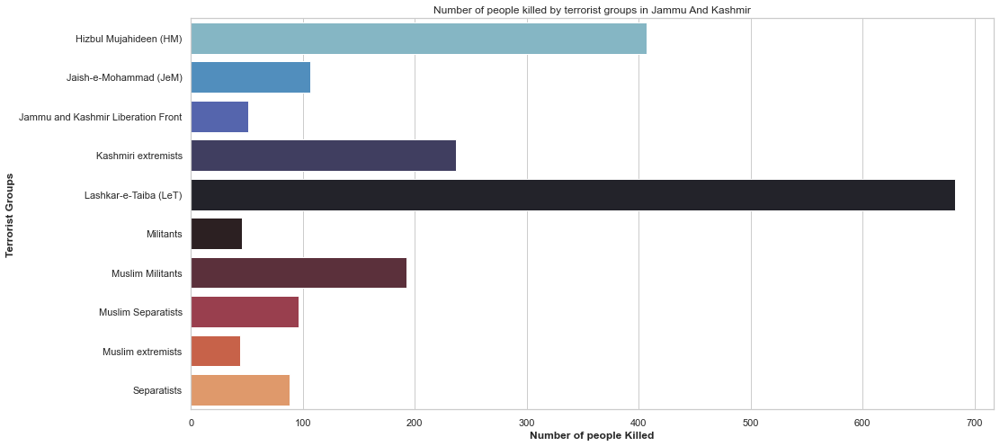

In [93]:
sns.set(style='whitegrid')
plt.figure(figsize=(16,8))
sns.barplot(y= Killed_Jammu.index.tolist(), x= Killed_Jammu.tolist(),palette='icefire')
plt.ylabel('Terrorist Groups', weight='bold')
plt.xlabel('Number of people Killed', weight='bold')
plt.title("Number of people killed by terrorist groups in Jammu And Kashmir")
plt.show()

## Number of people killed by groups in India

In [53]:
Killed = terror_India_top10['Killed'].groupby(terror_India_top10['Group']).sum()
Killed

Group
Communist Party of India - Maoist (CPI-Maoist)    2344.0
Garo National Liberation Army                       77.0
Hizbul Mujahideen (HM)                             409.0
Lashkar-e-Taiba (LeT)                              969.0
Maoists                                            790.0
Muslim Separatists                                 124.0
National Democratic Front of Bodoland (NDFB)       514.0
People's War Group (PWG)                           410.0
Sikh Extremists                                   2477.0
United Liberation Front of Assam (ULFA)            617.0
Name: Killed, dtype: float64

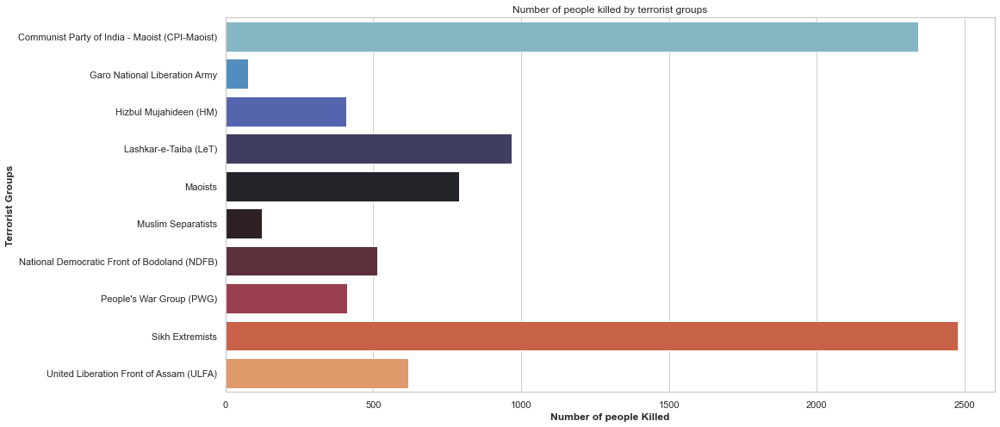

In [60]:
sns.set(style='whitegrid')
plt.figure(figsize=(16,8))
sns.barplot(y= Killed.index.tolist(), x= Killed.tolist(),palette='icefire')
plt.ylabel('Terrorist Groups', weight='bold')
plt.xlabel('Number of people Killed', weight='bold')
plt.title("Number of people killed by terrorist groups")
plt.show()

In [64]:
Wounded = terror_India_top10['Wounded'].groupby(terror_India_top10['Group']).sum()
Wounded

Group
Communist Party of India - Maoist (CPI-Maoist)    1663.0
Garo National Liberation Army                      102.0
Hizbul Mujahideen (HM)                             721.0
Lashkar-e-Taiba (LeT)                             1967.0
Maoists                                            809.0
Muslim Separatists                                 275.0
National Democratic Front of Bodoland (NDFB)       523.0
People's War Group (PWG)                           160.0
Sikh Extremists                                   2147.0
United Liberation Front of Assam (ULFA)           2155.0
Name: Wounded, dtype: float64

In [65]:
terror_India['state'].value_counts()

Jammu and Kashmir    2454
Assam                1151
Manipur              1100
Chhattisgarh          979
Punjab                949
Jharkhand             887
Bihar                 688
West Bengal           650
Odisha                428
Maharashtra           302
Meghalaya             294
Andhra Pradesh        251
Orissa                221
Delhi                 208
Uttar Pradesh         201
Tamil Nadu            164
Unknown               156
Tripura               117
Nagaland              115
Kerala                 98
Gujarat                85
Madhya Pradesh         75
Karnataka              71
Haryana                50
Chandigarh             47
Rajasthan              43
Andhra pradesh         41
Mizoram                27
Uttaranchal            24
Himachal Pradesh       24
Arunachal Pradesh      24
Telangana              24
Goa                     5
Sikkim                  4
Puducherry              2
Name: state, dtype: int64

In [85]:
terror_India_top10.loc[terror_India_top10['state'] == 'Jammu and Kashmir']['Group'].value_counts()

Hizbul Mujahideen (HM)    193
Lashkar-e-Taiba (LeT)     165
Muslim Separatists        113
Sikh Extremists            20
Name: Group, dtype: int64

In [80]:
terror_India.loc[terror_India['state'] == 'Jammu and Kashmir']['Group'].value_counts()[:15]

Unknown                               1471
Hizbul Mujahideen (HM)                 193
Lashkar-e-Taiba (LeT)                  165
Muslim Separatists                     113
Kashmiri extremists                     73
Muslim Militants                        70
Separatists                             51
Jammu and Kashmir Liberation Front      50
Jaish-e-Mohammad (JeM)                  31
Muslim extremists                       27
Militants                               23
Sikh Extremists                         20
Al-Mansoorian                           16
Tehrik al-Mojahedin                     13
Lashkar-e-Islam (India)                 13
Name: Group, dtype: int64

In [95]:
terror_India['state'].value_counts()

Jammu and Kashmir    2454
Assam                1151
Manipur              1100
Chhattisgarh          979
Punjab                949
Jharkhand             887
Bihar                 688
West Bengal           650
Odisha                428
Maharashtra           302
Meghalaya             294
Andhra Pradesh        251
Orissa                221
Delhi                 208
Uttar Pradesh         201
Tamil Nadu            164
Unknown               156
Tripura               117
Nagaland              115
Kerala                 98
Gujarat                85
Madhya Pradesh         75
Karnataka              71
Haryana                50
Chandigarh             47
Rajasthan              43
Andhra pradesh         41
Mizoram                27
Uttaranchal            24
Himachal Pradesh       24
Arunachal Pradesh      24
Telangana              24
Goa                     5
Sikkim                  4
Puducherry              2
Name: state, dtype: int64

# Creating a Function to determine number of attacks by Top 10 groups over state over the Years

In [134]:
def state_india(state_name):
    terror_state=terror_India[terror_India['state']==state_name]
    
    top10_state = terror_state.groupby('Group')['Year'].count().nlargest(11).index
    terror_state_top10 = terror_state[terror_state['Group'].isin(top10_state)]
    terror_state_top10 = terror_state_top10[~(terror_state_top10['Group']=='Unknown')]
    groupYear=pd.crosstab(terror_state_top10.Year, terror_state_top10.Group)
    groupYear.head
    
    return groupYear.head(10)

In [137]:
state_india('Rajasthan')

Group,Harkat ul Ansar,Jammu and Kashmir Islamic Front,Khalistan Commando Force,Lashkar-e-Taiba (LeT),Maoists,Muslim Militants,National Liberation Front of Tripura (NLFT),Sikh Extremists,United Democratic Terai Liberation Front (UDTLF),United Liberation Front of Assam (ULFA)
Year,,,,,,,,,,
1982,0,0,0,0,0,0,0,1,0,0
1984,0,0,0,0,0,0,0,1,0,0
1987,0,0,0,0,0,0,0,3,0,0
1988,0,0,0,0,0,0,0,4,0,0
1989,0,0,0,0,0,0,0,4,0,0
1991,0,0,0,0,0,0,0,1,0,0
1992,0,0,0,0,0,1,0,1,0,0
1995,0,0,1,0,0,0,1,0,0,0
1996,0,1,0,0,0,0,0,0,0,0


## Creating a function to determine number of people killed by top 10 groups in input-given state

In [140]:
def no_of_killed(statename):
    
    terror_state=terror_India[terror_India['state']==statename]
    top10_state = terror_state.groupby('Group')['Year'].count().nlargest(11).index
    terror_state_top10 = terror_state[terror_state['Group'].isin(top10_state)]
    terror_state_top10 = terror_state_top10[~(terror_state_top10['Group']=='Unknown')]
    
    Killed = terror_state_top10['Killed'].groupby(terror_state_top10['Group']).sum()
    
    sns.set(style='whitegrid')
    plt.figure(figsize=(16,8))
    sns.barplot(y= Killed.index.tolist(), x= Killed.tolist(),palette='icefire')
    plt.ylabel('Terrorist Groups', weight='bold')
    plt.xlabel('Number of people Killed', weight='bold')
    plt.title("Number of people killed by terrorist groups")
    plt.show()

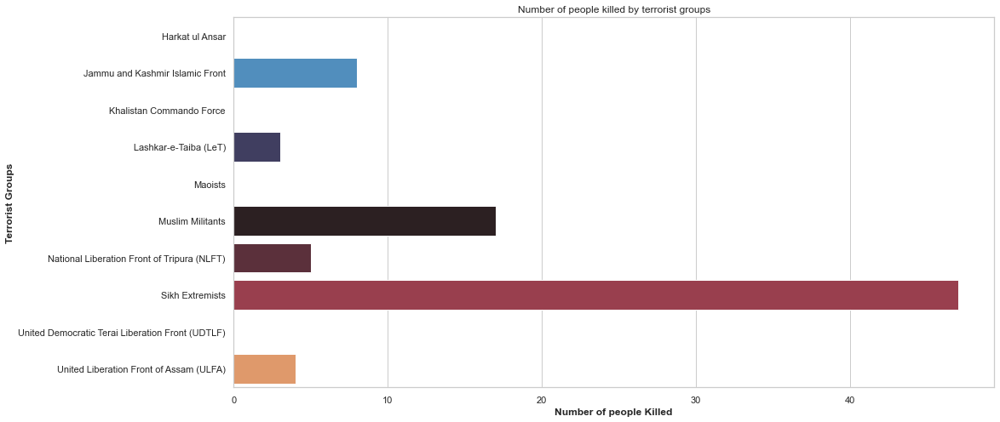

In [141]:
no_of_killed('Rajasthan')

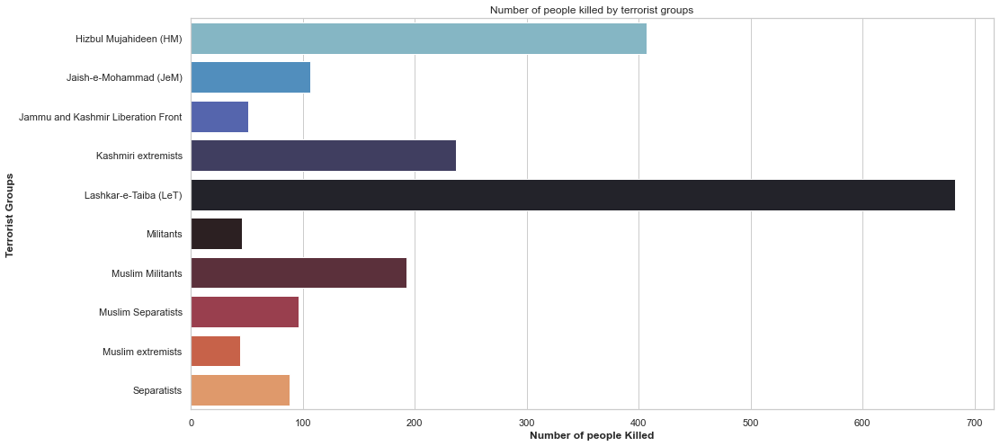

In [143]:
no_of_killed('Jammu and Kashmir')

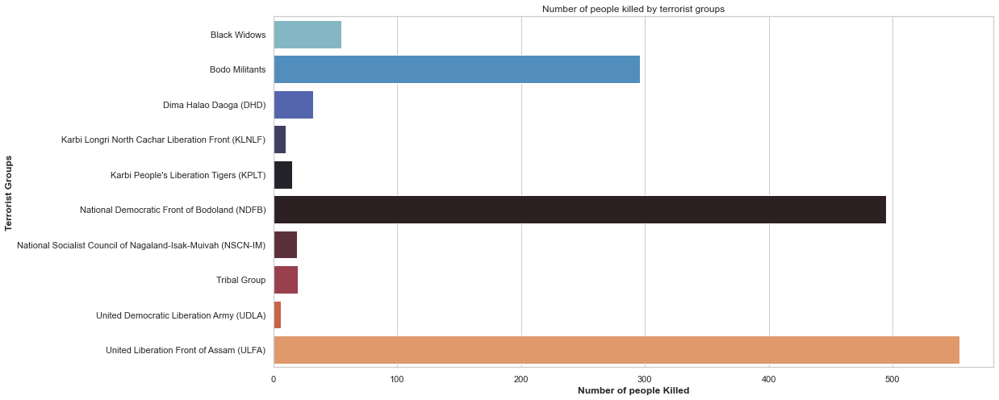

In [144]:
no_of_killed('Assam')

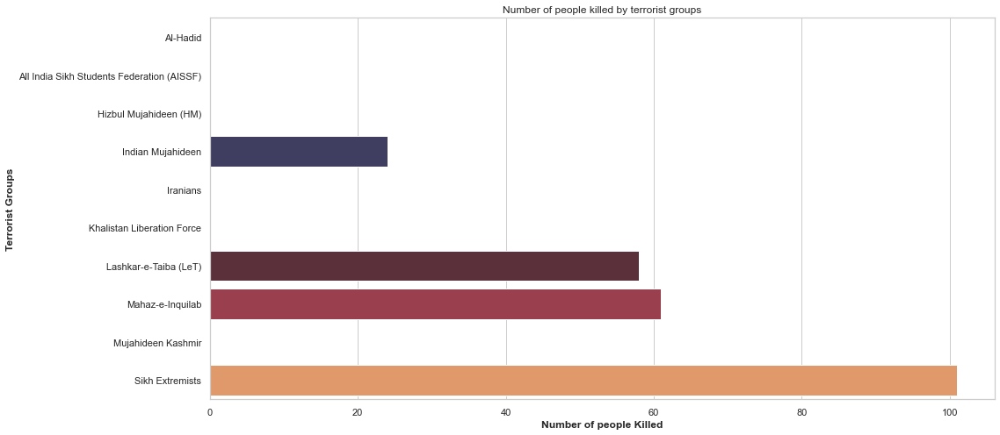

In [145]:
no_of_killed('Delhi')

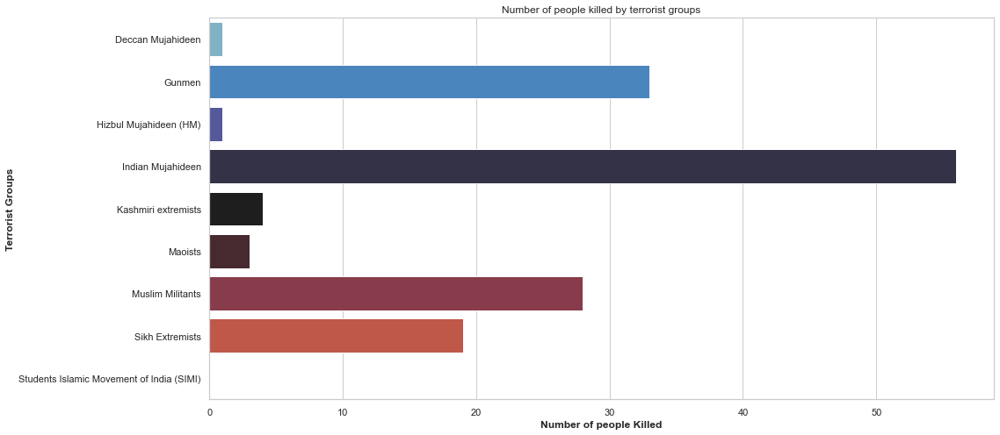

In [148]:
no_of_killed('Gujarat')